In [32]:
import numpy as np
from mnist import MNIST
import matplotlib as plt
from sklearn.neighbors import NearestNeighbors

In [33]:
from sklearn.cluster import KMeans

In [34]:
from display_network import *

<h3>Preparing Data</h3>

In [35]:
mnist = MNIST('MNIST/')
mnist.load_testing()

([[0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0

<h3>K-Means Implementation</h3>

In [36]:
# get test dataset for mnist
X = mnist.test_images
# get the first of 1000 items in dataset
# per item in mnsit is picture which has 28x28 pixels (0 -> 255 bit)
# divides all items with 256 => normalization methods.
X0 = np.asarray(X)[:1000, :]/256.0
X = X0
K = 10
kmeans = KMeans(n_clusters=K).fit(X)
predicted_label = kmeans.predict(X)

In [37]:
predicted_label

array([5, 7, 4, 3, 6, 4, 5, 9, 6, 2, 0, 0, 5, 0, 4, 7, 6, 5, 7, 9, 2, 3,
       6, 8, 9, 0, 5, 6, 3, 4, 7, 4, 7, 0, 2, 1, 5, 4, 7, 4, 4, 5, 9, 4,
       4, 7, 4, 1, 6, 6, 3, 7, 8, 7, 0, 3, 6, 4, 6, 2, 5, 2, 9, 1, 2, 9,
       0, 6, 8, 0, 5, 0, 1, 2, 4, 5, 7, 5, 2, 2, 9, 3, 1, 5, 8, 6, 2, 7,
       3, 4, 7, 3, 2, 7, 4, 6, 4, 2, 3, 6, 3, 0, 8, 6, 6, 6, 0, 4, 9, 5,
       1, 4, 4, 9, 2, 2, 9, 6, 5, 2, 8, 2, 5, 3, 5, 9, 0, 8, 8, 8, 3, 3,
       8, 5, 8, 4, 3, 4, 3, 2, 3, 5, 7, 4, 2, 4, 8, 1, 3, 4, 6, 6, 2, 8,
       4, 8, 3, 3, 7, 4, 9, 3, 8, 6, 3, 7, 5, 4, 4, 9, 9, 2, 7, 7, 1, 4,
       4, 8, 4, 8, 4, 8, 8, 0, 1, 5, 1, 7, 0, 4, 4, 4, 0, 9, 0, 4, 4, 3,
       9, 1, 7, 0, 4, 4, 4, 7, 9, 7, 1, 9, 6, 2, 6, 4, 9, 3, 7, 2, 2, 7,
       5, 1, 3, 2, 4, 1, 8, 5, 4, 5, 7, 4, 8, 2, 5, 5, 1, 1, 6, 4, 8, 8,
       2, 5, 4, 3, 0, 1, 6, 1, 9, 4, 9, 8, 5, 5, 1, 4, 1, 0, 2, 4, 5, 5,
       9, 4, 3, 4, 7, 0, 7, 0, 4, 5, 6, 6, 4, 8, 1, 4, 1, 2, 5, 2, 6, 1,
       3, 6, 4, 7, 9, 1, 9, 1, 0, 9, 0, 0, 1, 8, 4,

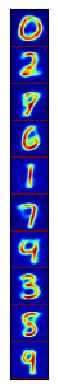

In [38]:
A = display_network(kmeans.cluster_centers_.T, K, 1)
f1 = plt.imshow(A, interpolation='nearest', cmap = "jet")
f1.axes.get_xaxis().set_visible(False)
f1.axes.get_yaxis().set_visible(False)
plt.show()

In [40]:
n = 20
'''
Each image in MNIST is 28 pixels wide x 28 pixels high.
When the 2D image is flattened into a 1D vector, we get:
28 x 28 = 784 features/pixels.
'''
X1 = np.zeros((n*K, 28*28))
X2 = np.zeros((n*K, 28*28))
for k in range (K):
    # Step 1: Get all data points belonging to cluster k.
    Xk = X0[predicted_label == k, :]
    # Step 2: Find the N0 nearest points to the centroid of cluster k.
    center_k = [kmeans.cluster_centers_[k]]
    neighbor = NearestNeighbors(n_neighbors=n).fit(Xk)
    distance, nearest_id = neighbor.kneighbors(center_k, n)
    # Step 3: Store in X1 - the points closest to the centroid
    X1[n*k : n*k + n, :] = Xk[nearest_id, :]
    # Step 4: Store in X2 - the first N0 points of the cluster.
    X2[n*k : n*k + n, :] = Xk[:n, :]


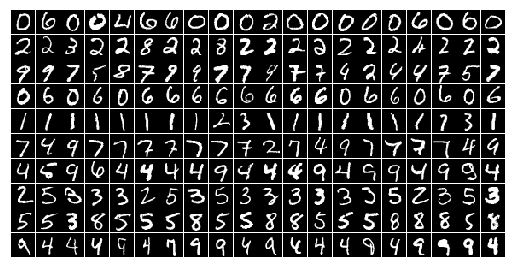

In [41]:
plt.axis('off')
A = display_network(X2.T, K, n)
f2 = plt.imshow(A, interpolation='nearest' )
plt.gray()
plt.show()

<h3>Object Segmentation</h3>

In [42]:
import matplotlib.image as mpimg

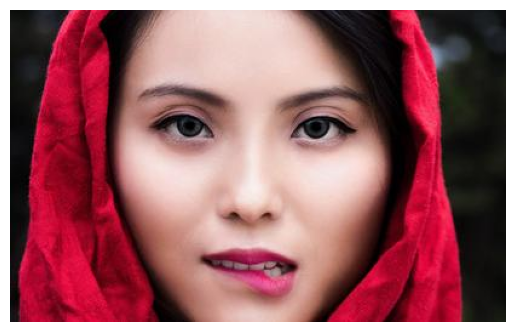

In [43]:
img = mpimg.imread('Image/girl3.jpg')
plt.imshow(img)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show() 

In [46]:
X = img.reshape((img.shape[0]*img.shape[1], img.shape[2]))
X

array([[12, 14, 11],
       [12, 14, 11],
       [11, 13, 10],
       ...,
       [23, 29, 19],
       [23, 29, 19],
       [23, 29, 19]], dtype=uint8)

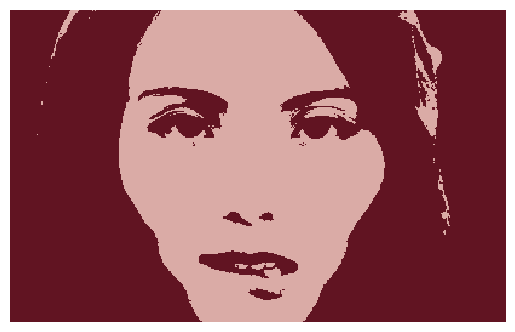

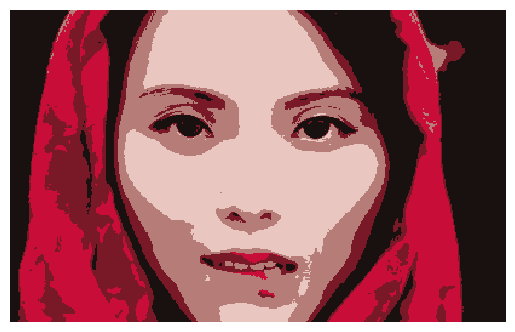

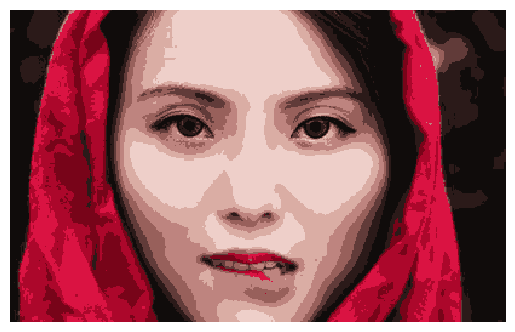

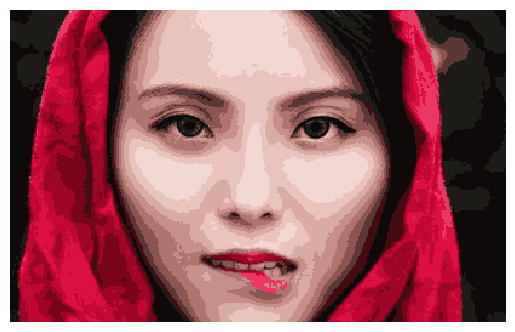

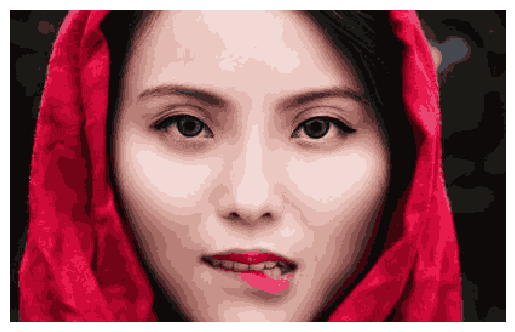

In [48]:
for K in [2, 5, 10, 15, 20]:
    kmeans = KMeans(n_clusters=K).fit(X)
    labels = kmeans.predict(X)
    tmp_img = np.zeros_like(X)
    # replace each pixel by its center
    for k in range(K):
        tmp_img[labels == k] = kmeans.cluster_centers_[k]
    centers_img = tmp_img.reshape((img.shape[0], img.shape[1], img.shape[2]))
    plt.imshow(centers_img, interpolation='nearest')
    plt.axis('off')
    plt.show()
